In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm, Normalize
from scipy.ndimage import gaussian_filter

In [6]:
data = pd.read_csv('SCF9443.counts.txt',delim_whitespace=True)

In [7]:
data

,Geneid,Chr,Start,End,Strand,Length,SCF9443
0,ENSMUSG00000102693,1,3073253,3074322,+,1070,0
1,ENSMUSG00000064842,1,3102016,3102125,+,110,0
2,ENSMUSG00000051951,1;1;1;1;1;1;1,3205901;3206523;3213439;3213609;3214482;342170...,3207317;3207317;3215632;3216344;3216968;342190...,-;-;-;-;-;-;-,6094,1307
3,ENSMUSG00000102851,1,3252757,3253236,+,480,0
4,ENSMUSG00000103377,1,3365731,3368549,-,2819,7
...,...,...,...,...,...,...,...
49310,ENSMUSG00000094431,GL456385.1,32719,32818,+,100,0
49311,ENSMUSG00000094621,GL456372.1,13262,13382,-,121,0
49312,ENSMUSG00000098647,GL456381.1,16623,16721,-,99,0
49313,ENSMUSG00000096730,JH584292.1;JH584292.1;JH584292.1;JH584292.1;JH...,3536;3536;3536;3539;3573;5658;5658;5658;5658;6...,3826;3826;3826;3826;3826;5940;5940;5940;5940;6...,+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+;+,3077,0


### trials

In [8]:
single_vector = []
cols = []
count = 0
for i in range(9443,9634):
    data = pd.read_csv('SCF' + str(i) + '.counts.txt',delim_whitespace=True)
#     print(len(data['SCF' + str(i)].values))
    single_vector.append(data['SCF' + str(i)].values)
    count += 1
    cols.append(str(i))
indexes= data['Geneid'].values

In [9]:
newdf = pd.DataFrame(single_vector)

In [10]:
newdf = newdf.transpose()
newdf.columns = cols
newdf.index = indexes

In [11]:
newdf

,9443,9444,9445,9446,9447,9448,9449,9450,9451,9452,...,9624,9625,9626,9627,9628,9629,9630,9631,9632,9633
ENSMUSG00000102693,0,2,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,2,0,0
ENSMUSG00000064842,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000051951,1307,536,853,1204,1392,532,829,1154,1236,686,...,558,611,1069,840,544,752,719,931,589,864
ENSMUSG00000102851,0,1,2,3,2,1,1,5,4,4,...,3,1,11,3,1,0,5,4,3,4
ENSMUSG00000103377,7,3,0,8,4,7,6,6,7,5,...,3,1,6,9,4,3,6,8,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000094431,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000094621,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000098647,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000096730,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


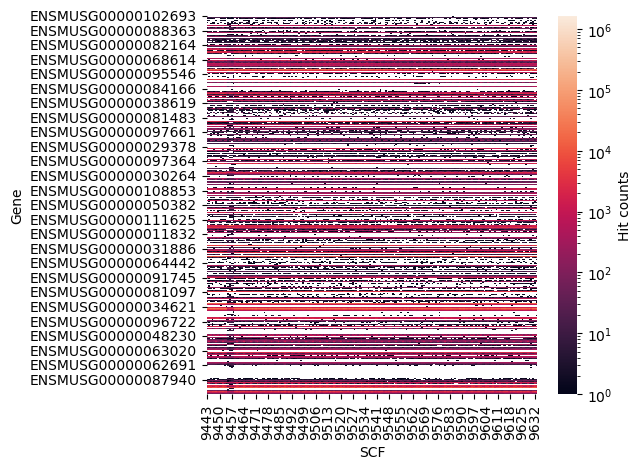

In [12]:
ax = sns.heatmap(newdf,norm=LogNorm())
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Hit counts');
plt.tight_layout()
plt.savefig("heatmap.png")
plt.savefig("heatmap.pdf")

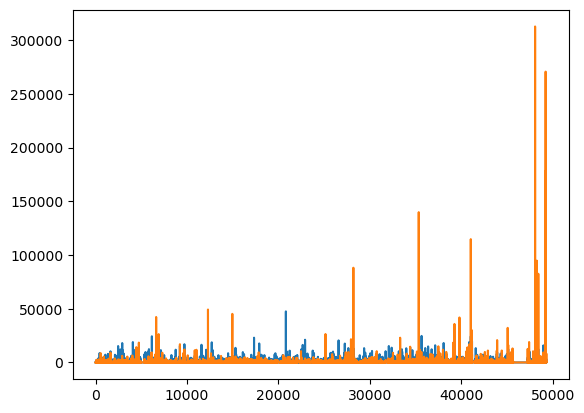

In [13]:
plt.plot(gaussian_filter(newdf['9444'].values,sigma=1))
plt.plot(gaussian_filter(newdf['9455'].values,sigma=1))
# plt.semilogy(gaussian_filter(newdf['9569'].values,sigma=4))

In [14]:
groups = pd.read_csv('groups.dat',delim_whitespace=True)

(1) The first one or two digits are animal age in month (e.g. 24 means 24-month old); (2) The second two capital letters are genotypes (i.e. KO = knockout, WT = wild type); (3) The third capital letter marks mouse sex (i.e. M = male, F = female); (4) The fourth letter represents biological replicas (i.e. the three replicas are labeled as "a", "b", "c"); (5) The two letters after the underscore sign are abbrevations for brain regions (i.e. ct = prefront cortex, cb = cerebellum, md = midbrain,  hi = hippocampus)

In [15]:
def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))

## divide KO and Wild

sub = 'KO'
start = 1
kogroup = groups[groups['group'].str.find(sub,start)>0].index.tolist()
kodf = newdf.iloc[:,kogroup]

sub = 'W'
wgroup = groups[groups['group'].str.find(sub)>0].index.tolist()
wgroup = wgroup[:-1]
wdf = newdf.iloc[:,wgroup]

## to divide by group KO
sub = 'ct'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,kogroup)
newdf_koct= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age

sub = 'cb'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,kogroup)
newdf_kocb= newdf.iloc[:,ll[::-1]]

sub = 'md'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,kogroup)
newdf_komd= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age

sub = 'hi'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,kogroup)
newdf_kohi= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age

## to divide by group Wild
sub = 'ct'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,wgroup)
newdf_wct= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age

sub = 'cb'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,wgroup)
newdf_cb= newdf.iloc[:,ll[::-1]]
newdf_wcb = newdf[::-1] #reverse order to get progressing age

sub = 'md'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,wgroup)
newdf_wmd= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age

sub = 'hi'
start = 4
ll = groups[groups['group'].str.find(sub,start)>0].index.tolist()
ll=intersection(ll,wgroup)
newdf_whi= newdf.iloc[:,ll[::-1]] #reverse order to get progressing age



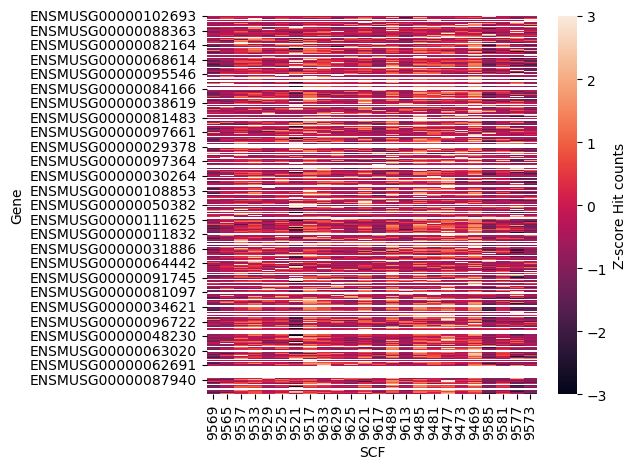

In [16]:

df_norm_row = newdf_wmd.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_koct.png")

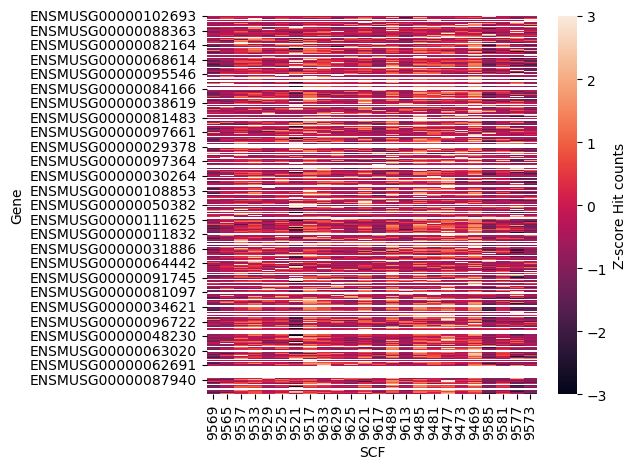

In [17]:


df_norm_row = newdf_wmd.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
# ax = sns.heatmap(newdf_kocb,norm=LogNorm()).
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_kocb.png")

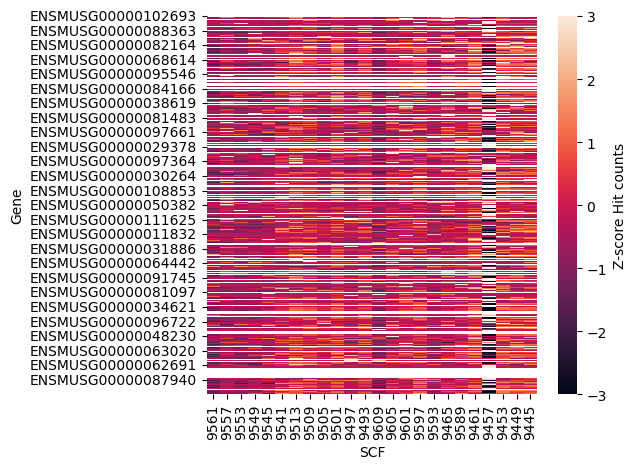

In [18]:
df_norm_row = newdf_komd.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)

# ax = sns.heatmap(newdf_kocb,norm=LogNorm())

ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_komd.png")

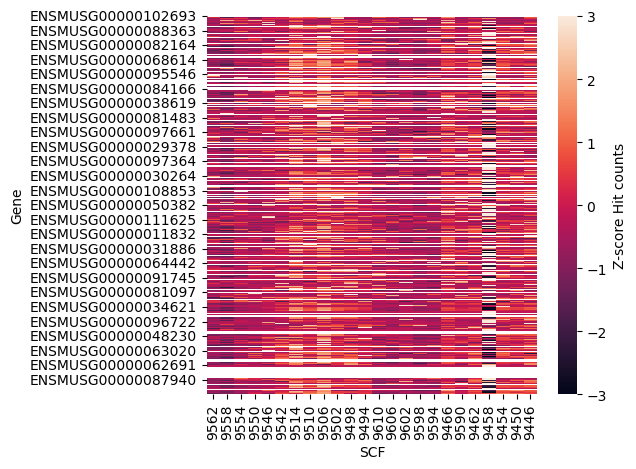

In [19]:
df_norm_row = newdf_kohi.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_kohi.png")

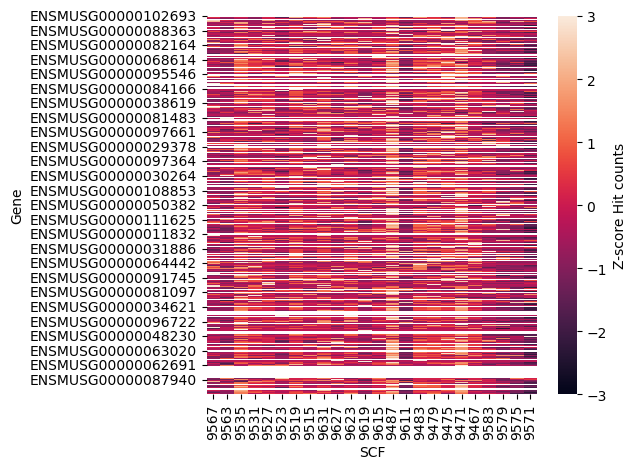

In [20]:
df_norm_row = newdf_wct.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_wct.png")


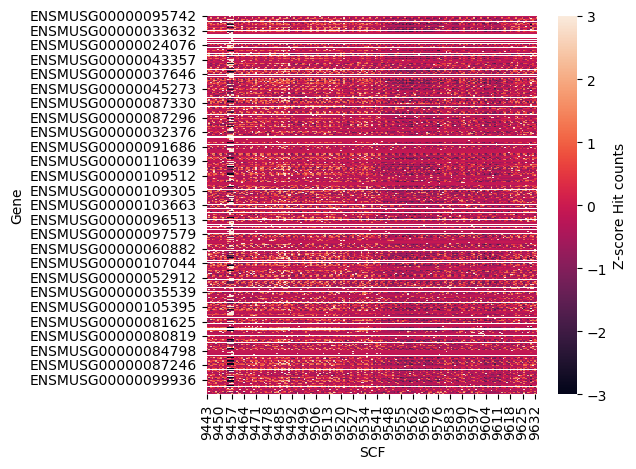

In [21]:
# ax = sns.heatmap(newdf_wcb,norm=LogNorm())
df_norm_row = newdf_wcb.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
plt.savefig("heatmap_wcb.png")


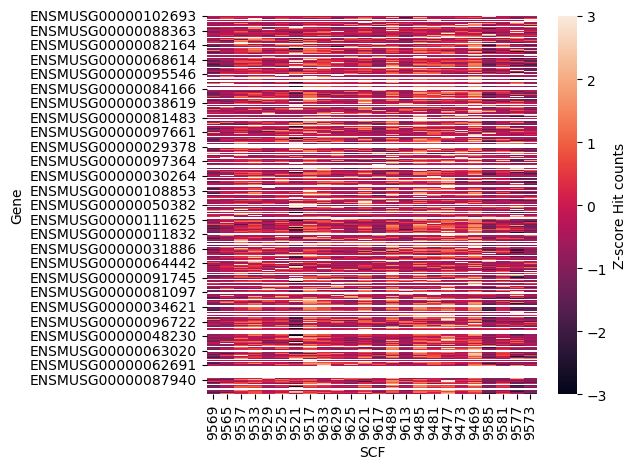

In [22]:
df_norm_row = newdf_wmd.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
#ax = sns.heatmap(newdf_wmd)#,norm=LogNorm())
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_wmd.png")

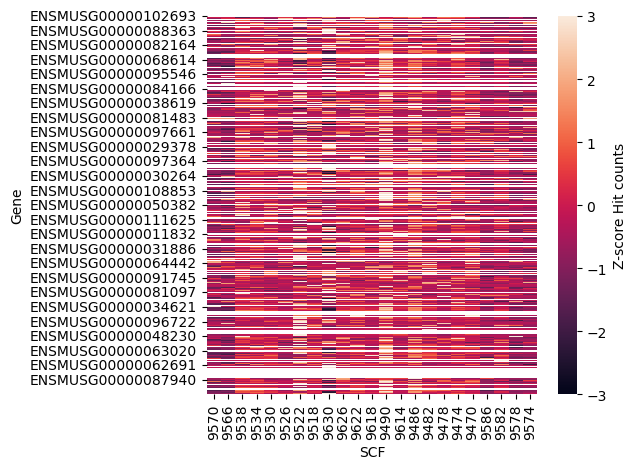

In [23]:
df_norm_col=(newdf_whi-newdf_whi.mean())/newdf_whi.std()
df_norm_row = newdf_whi.apply(lambda x: (x-x.mean())/x.std(), axis = 1)
ax = sns.heatmap(df_norm_row, vmin=-3, vmax=3)
ax.set(ylabel="Gene", xlabel="SCF")
ax.collections[0].colorbar.set_label('Z-score Hit counts');
plt.tight_layout()
#plt.savefig("heatmap.png")
plt.savefig("heatmap_whi.png")

In [24]:
newdf_whi

,9570,9566,9538,9534,9530,9526,9522,9518,9630,9626,...,9614,9486,9482,9478,9474,9470,9586,9582,9578,9574
ENSMUSG00000102693,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000064842,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
ENSMUSG00000051951,752,717,1071,981,1110,939,919,1194,719,1069,...,1150,1309,1169,989,1556,1498,869,798,704,772
ENSMUSG00000102851,2,1,2,7,8,5,11,4,5,11,...,2,7,11,4,1,10,2,5,5,4
ENSMUSG00000103377,3,5,7,10,7,10,11,5,6,6,...,7,14,26,7,4,9,2,11,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000094431,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000094621,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000098647,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000096730,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
import plotly.express as px
from sklearn.decomposition import PCA

features = ["9570", "9530", "9470", "9578"]

pca = PCA()
components = pca.fit_transform(newdf[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
#     color=newdf["species"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [26]:
def flatten(l):
    return [item for sublist in l for item in sublist]

# wmd6  = flatten(newdf_wmd.iloc[:,np.where(np.bitwise_and(newdf_wmd.columns.astype(int)<=9634, newdf_wmd.columns.astype(int)>9586)==True)[0]].values.tolist())
wmd12 = flatten(newdf_wmd.iloc[:,np.where(np.bitwise_and(newdf_wmd.columns.astype(int)<=9586, newdf_wmd.columns.astype(int)>9538)==True)[0]].values.tolist())
wmd18 = flatten(newdf_wmd.iloc[:,np.where(np.bitwise_and(newdf_wmd.columns.astype(int)<=9538, newdf_wmd.columns.astype(int)>9490)==True)[0]].values.tolist())
wmd24 = flatten(newdf_wmd.iloc[:,np.where(np.bitwise_and(newdf_wmd.columns.astype(int)<=9490, newdf_wmd.columns.astype(int)>9442)==True)[0]].values.tolist())

# whi6  = flatten(newdf_whi.iloc[:,np.where(np.bitwise_and(newdf_whi.columns.astype(int)<=9634, newdf_whi.columns.astype(int)>9586)==True)[0]].values.tolist())
whi12 = flatten(newdf_whi.iloc[:,np.where(np.bitwise_and(newdf_whi.columns.astype(int)<=9586, newdf_whi.columns.astype(int)>9538)==True)[0]].values.tolist())
whi18 = flatten(newdf_whi.iloc[:,np.where(np.bitwise_and(newdf_whi.columns.astype(int)<=9538, newdf_whi.columns.astype(int)>9490)==True)[0]].values.tolist())
whi24 = flatten(newdf_whi.iloc[:,np.where(np.bitwise_and(newdf_whi.columns.astype(int)<=9490, newdf_whi.columns.astype(int)>9442)==True)[0]].values.tolist())

In [27]:
features = [ "WHi",'Wmd']

wwhi = flatten([whi12,whi18,whi24]) #whi6,
wwmd = flatten([wmd12,wmd18,wmd24]) #wmd6,
ages = flatten([ 12*np.ones(len(whi12)), 18*np.ones(len(whi18)),24*np.ones(len(whi24))])
 #6*np.ones(len(whi6)),
dfwhi_age = pd.DataFrame(
    {'Whi': wwhi,
     'Wmd': wwmd,
     'age': ages,
    })

dfwhi_age['Whi'] =(dfwhi_age['Whi']-dfwhi_age['Whi'].mean())/dfwhi_age['Whi'].std()
dfwhi_age['Wmd'] =(dfwhi_age['Wmd']-dfwhi_age['Wmd'].mean())/dfwhi_age['Wmd'].std()


pca = PCA()
components = pca.fit_transform(dfwhi_age)
# labels = {
#     str(i): f"PC {i+1} ({var:.1f}%)"
#     for i, var in enumerate(pca.explained_variance_ratio_ * 100)
# }

# fig = px.scatter_matrix(
#     components,
#     labels=labels,
#     dimensions=range(2),
#     color=dfwhi_age["age"]
# )
# fig.update_traces(diagonal_visible=False)
# fig.show()

[Text(0, -25.0, ''),
 Text(0, 0.0, ''),
 Text(0, 25.0, ''),
 Text(0, 50.0, ''),
 Text(0, 75.0, ''),
 Text(0, 100.0, ''),
 Text(0, 125.0, ''),
 Text(0, 150.0, ''),
 Text(0, 175.0, ''),
 Text(0, 200.0, '')]

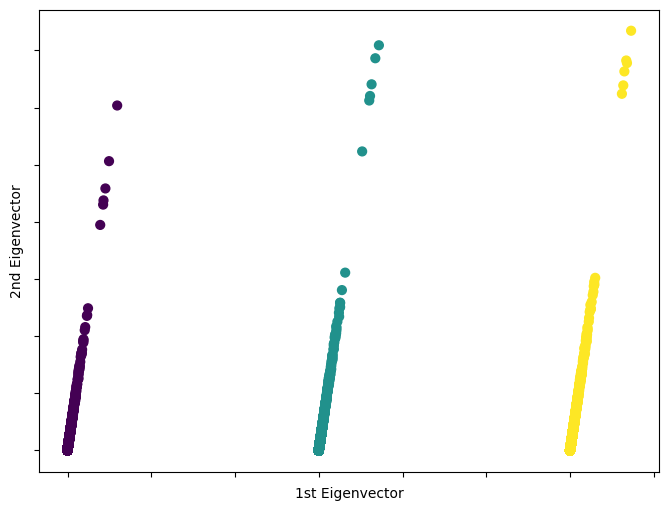

In [28]:
fig = plt.figure(1, figsize=(8, 6))
ax = fig.add_subplot(111)#, projection="3d", elev=-150, azim=110)

# X_reduced = PCA(n_components=3).fit_transform(iris.data)
ax.scatter(
    components[:, 0],
    components[:, 1],
    c=dfwhi_age["age"],
    s=40,
)

# ax.set_title("First three PCA dimensions")
ax.set_xlabel("1st Eigenvector")
ax.xaxis.set_ticklabels([])
ax.set_ylabel("2nd Eigenvector")
ax.yaxis.set_ticklabels([])
# ax.set_zlabel("3rd Eigenvector")
# ax.zaxis.set_ticklabels([])

In [29]:
df

NameError: name 'df' is not defined

In [ ]:
plt.plot(whi12)

In [ ]:
plt.plot(whi6)

In [ ]:
wdf

In [49]:
newdf.T.index


Index(['9443', '9444', '9445', '9446', '9447', '9448', '9449', '9450', '9451',
       '9452',
       ...
       '9624', '9625', '9626', '9627', '9628', '9629', '9630', '9631', '9632',
       '9633'],
      dtype='object', length=191)

In [32]:
print(newdf.T)  ##sample in rows and gene in columns

      ENSMUSG00000102693  ENSMUSG00000064842  ENSMUSG00000051951  \
9443                   0                   0                1307   
9444                   2                   0                 536   
9445                   0                   0                 853   
9446                   0                   0                1204   
9447                   0                   0                1392   
...                  ...                 ...                 ...   
9629                   0                   0                 752   
9630                   1                   0                 719   
9631                   2                   0                 931   
9632                   0                   0                 589   
9633                   0                   0                 864   

      ENSMUSG00000102851  ENSMUSG00000103377  ENSMUSG00000104017  \
9443                   0                   7                  13   
9444                   1                   3   

In [70]:
ages = flatten([6*np.ones(48), 12*np.ones(48), 18*np.ones(48), 24*np.ones(47)])
ko_w_group = flatten([['KO']*24, ['W']*24,['KO']*24, ['W']*24,['KO']*24, ['W']*24, ['KO']*24, ['W']*23])

In [71]:
metadata = pd.DataFrame(
    {
     'age': ages,
     'group' : ko_w_group
    })
metadata.index = newdf.T.index

In [74]:
!pip install pydeseq2

ERROR: Ignored the following versions that require a different python version: 0.1 Requires-Python >=3.8.0; 0.1.1 Requires-Python >=3.8.0; 0.2.0 Requires-Python >=3.8.0; 0.2.1 Requires-Python >=3.8.0; 0.3.0 Requires-Python >=3.8.0; 0.3.1 Requires-Python >=3.8.0; 0.3.2 Requires-Python >=3.8.0; 0.3.3 Requires-Python >=3.8.0; 0.3.4 Requires-Python >=3.8.0; 0.3.5 Requires-Python >=3.8.0; 0.3.6 Requires-Python >=3.8.0; 0.4.0 Requires-Python >=3.8.0; 0.4.1 Requires-Python >=3.8.0; 0.4.2 Requires-Python >=3.8.0; 0.4.3 Requires-Python >=3.8.0
ERROR: Could not find a version that satisfies the requirement pydeseq2 (from versions: none)
ERROR: No matching distribution found for pydeseq2


In [73]:
import os
import pickle as pkl

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
from pydeseq2.utils import load_example_data

ModuleNotFoundError: No module named 'pydeseq2'